In [3]:
#Download the slides
!gdown https://drive.google.com/uc?id=1TfORpT839R8ck03Ula-qaoy243snimRe

Downloading...
From: https://drive.google.com/uc?id=1TfORpT839R8ck03Ula-qaoy243snimRe
To: /content/slides_s11_matching.pdf
100% 2.40M/2.40M [00:00<00:00, 189MB/s]


In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Template matching

In [5]:
# Download the image and the template
!gdown https://drive.google.com/uc?id=1JPl1ZLSiiXZ2MaTksA5wBUVbvvVY9mkt
!gdown https://drive.google.com/uc?id=1GAi5FLpRS7BgkLoP5fD8GWnYmYFiw1uY

Downloading...
From: https://drive.google.com/uc?id=1JPl1ZLSiiXZ2MaTksA5wBUVbvvVY9mkt
To: /content/ad.png
100% 102k/102k [00:00<00:00, 44.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1GAi5FLpRS7BgkLoP5fD8GWnYmYFiw1uY
To: /content/template.png
100% 10.6k/10.6k [00:00<00:00, 14.4MB/s]


#### Take a look again at the image and the template

In [6]:
# Read the ad image and the template in grayscale
img = cv2.imread('ad.png',0)
template = cv2.imread('template.png',0)

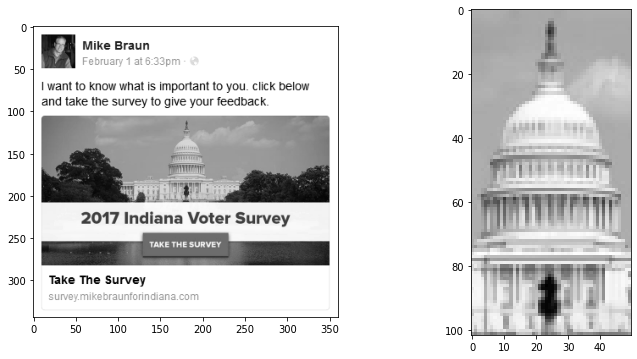

In [7]:
plt.figure(figsize=(12, 6))
plt.subplot(121) 
plt.imshow(img, cmap='gray')
plt.subplot(122) 
plt.imshow(template, cmap='gray')

#### Template matching using six similarity measures

In [8]:
template.shape

(102, 50)

In [9]:
# Store width and heigth of template in w and h 
h, w = template.shape

In [10]:
# All the 6 methods for comparison in a list
methods = ['cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED', 'cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED']

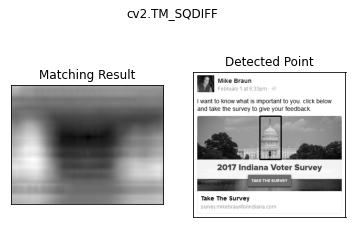

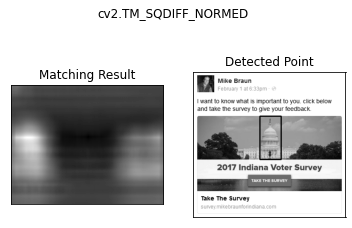

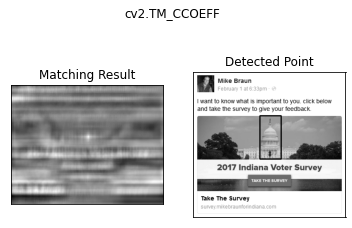

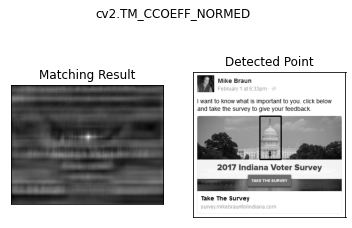

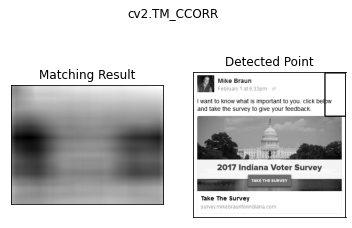

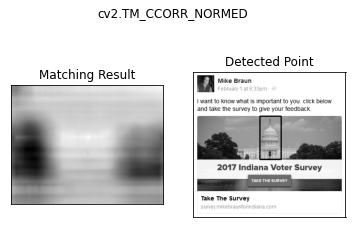

In [11]:
img2 = img.copy()
for meth in methods:
    img = img2.copy()
    method = eval(meth) # parse the string
    # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(img,top_left, bottom_right, 0, 2)
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()

# Feature matching

### ORB

**Oriented FAST and Rotated BRIEF**

Both SIFT and SURF are patented, and techniquely you need to pay a licensing fee to use them. Fortunately, we can use ORB, which is faster than SIFT and SURF and free for commerical use.

A feature has two components: **detectors** tell you the location of the feature, and **descriptors** describes the region around the feature, so we can match a feature in one image to a feature in another image.

The detector in ORB is FAST (features from accelerated segment test); The descriptors in ORB is BRIEF (binary robust independent elementary features).

**How does ORB work?** http://www.willowgarage.com/sites/default/files/orb_final.pdf
1. Convert the image to gray scale. 
2. To find detectors(features/interesting points), examine a patch around each pixel to identify either a dark corner with a light background or a bright corner with a dark background.
3. Calculate the centriod of the patch using image moments and find the feature orientation.
4. Smooth the image using Gaussian filter.
5. To find descriptors of size 128 bits, take difference between pixel intensities.
6. Points used to calculate BRIEF features are rotated using the patch orientation so that the descriptors are invariant to rotation.

In [25]:
!gdown https://drive.google.com/uc?id=1cic5vlwhgPNfPcki6DGWgDZd8Z0rVgjR

Downloading...
From: https://drive.google.com/uc?id=1cic5vlwhgPNfPcki6DGWgDZd8Z0rVgjR
To: /content/book.jpeg
100% 67.0k/67.0k [00:00<00:00, 42.1MB/s]


In [26]:
img = cv2.imread("book.jpeg")
imgGray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

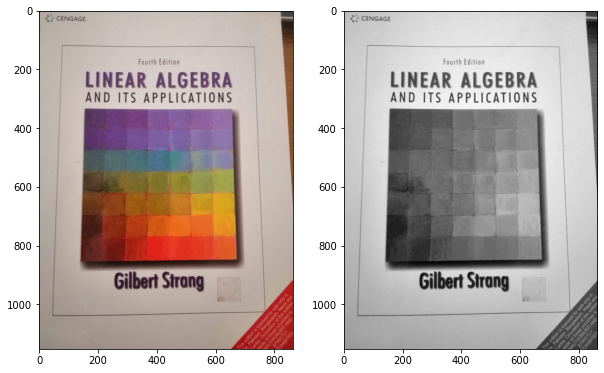

In [27]:
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img[:,:,::-1])
plt.subplot(1,2,2)
plt.imshow(imgGray,cmap="gray")
plt.show()

In [28]:
# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints with ORB
kp = orb.detect(imgGray,None)

In [29]:
# compute the descriptors with ORB
kp, des = orb.compute(imgGray, kp)

In [30]:
# draw keypoints location, size and orientation
img2 = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

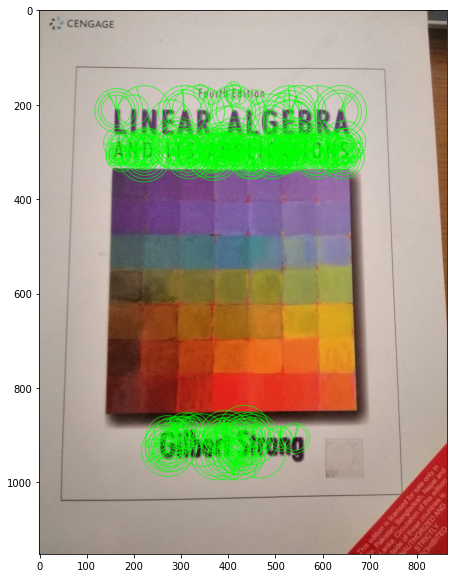

In [31]:
plt.figure(figsize=(10,10))
plt.imshow(img2[:,:,::-1])

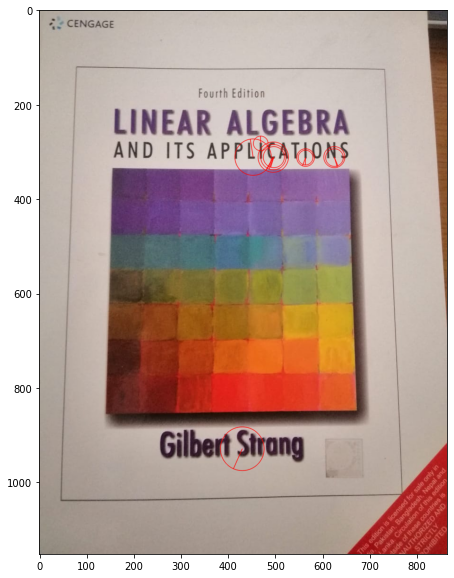

In [32]:
# Let us have a closer look and display only 10 features.
orb = cv2.ORB_create(10)
kp, des = orb.detectAndCompute(imgGray, None)
img2 = cv2.drawKeypoints(img, kp, None, color=(0,0,255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(10,10))
plt.imshow(img2[:,:,::-1])

Once we have found good features ( like ORB ) in an image, we can use them to accomplish various computer vision tasks by matching features in different images. Think of these features as the DNA of the image.

There are 3 types of feature matching methods available in OpenCV:

- Brute-Force matcher
- Descriptor Matcher
- FLANN Matcher

**Compute ORB Descriptors**

We are using ORB descriptors to match features. So let's start with loading images and finding descriptors.

In [33]:
!gdown https://drive.google.com/uc?id=18BP01ekoXjcxmCLeZbIXjQ-Si3KOCo8W

Downloading...
From: https://drive.google.com/uc?id=18BP01ekoXjcxmCLeZbIXjQ-Si3KOCo8W
To: /content/book_scene.jpeg
100% 139k/139k [00:00<00:00, 54.5MB/s]


In [34]:
img1 = cv2.imread("book.jpeg", cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread("book_scene.jpeg", cv2.IMREAD_GRAYSCALE)

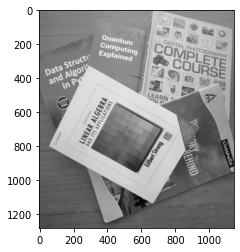

In [35]:
plt.imshow(img2, cmap="gray")

In [36]:
# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

### Brute-Force matching using ORB

Brute-Force matcher takes the descriptor of one feature in first set and is matched with all other features in second set using some distance calculation. And the closest one is returned.



`cv2.BFMatcher`

- NormType: It specifies the distance measurement to be used. By default, it is cv2.NORM_L2 which is good for SIFT, SURF etc. For binary string based descriptors like ORB, BRIEF, BRISK etc, cv2.NORM_HAMMING should be used, which uses Hamming distance as measurement.
- crossCheck which is False by default. If it is True, Matcher returns only those matches with value (i,j) such that i-th descriptor in set A has j-th descriptor in set B as the best match and vice-versa. That is, the two features in both sets should match each other. 

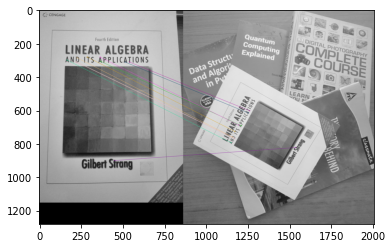

In [37]:
# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)
# The other option:
# matches = bf.knnMatch()

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(img3)

# Homework

Due on Oct 14 (Friday) at 5pm. 

## 1. Template matching (100 points)

Template Matching is often used to find a smaller image (template image) inside of a bigger one. One application for this technique is to determine whether a news broadcast is going on based on the logo of the news station being present on the screen or not.
 
1. Download a news clip using Youtube-dl
2. Split the news clip into frames and save it in a file
3. Run the template matching algorithm on each frame to determine whether the news logo is present.
4. Explain your findings.

### 1.1 Prepare the Data (40 points)

#### 1.1.1 Download the Youtube Video 

Refer to the Colab Notebook from Feb 25 to download the following clip using Youtube-dl: [News Clip Link](https://www.youtube.com/watch?v=fq4ywJ4vliw)

In [38]:
pwd


'/content'

In [39]:
cd /content

/content


In [40]:
import cv2 
import time


In [ ]:
!pip install youtube-dl
!youtube-dl --id https://www.youtube.com/watch?v=fq4ywJ4vliw


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 5.3 MB/s 
[youtube] fq4ywJ4vliw: Downloading webpage
[youtube] fq4ywJ4vliw: Downloading MPD manifest
[download] Destination: fq4ywJ4vliw.f133.mp4
[download] 100% of 4.62MiB in 00:57
[download] Destination: fq4ywJ4vliw.f140.m4a
[download] 100% of 2.59MiB in 00:32
[ffmpeg] Merging formats into "fq4ywJ4vliw.mp4"
Deleting original file fq4ywJ4vliw.f133.mp4 (pass -k to keep)
Deleting original file fq4ywJ4vliw.f140.m4a (pass -k to keep)


#### 1.1.2 Split into Frames 

Create a folder called frames and use the provided ExtractFrames() function to split the news clip into frames.


In [1]:
pwd

'/content'

In [42]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os


In [43]:
cd /content/drive/MyDrive/Colab Notebooks/QAC239/hw3/

[Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/'
/content


In [44]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [75]:
# Outputs a series of frames according to the set frame rate. The frames are stored inside of '/frames'.
def ExtractFrames(path): 
    # Path to video file 
    vidObj = cv2.VideoCapture(path) 
  
    # Used as counter variable for naming the image
    count = 0
  
    # checks whether frames were extracted 
    success = 1

    # For setting sampling rate for the frame extraction 
    frame_rate = 20
    prev = 0
    while success: 
        # vidObj object calls read
        success, image = vidObj.read()

        # keep track of passed time 
        time_elapsed = time.time() - prev

        # keep frames according to the set frame_rate 
        if time_elapsed > 1./frame_rate:
          prev = time.time() # reset the timer function
          cv2.imwrite("frames/frame%d.jpg" % count, image) # save the file in a folder called frames with a unique name. 
        # Saves the frames with frame-count
        count += 1
        
ExtractFrames('/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/fq4ywJ4vliw.mp4')

### 1.2 Template Matching Algorithm (60 points)

#### 1.2.1 Run Template Matching on the data 

Using any photo editing tool, crop out and save the NBC News Logo on the bottom right of the clip as a template. (**For best results, make sure that the size of the template image is similar to as it appears inside the actual frames**.)

Run the template matching algorithm using the **'cv2.TM_CCOEFF'** method on each frame, and display the matching results.

In [76]:
pwd

'/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/frames'

In [77]:
cd '/content/drive/MyDrive/Colab Notebooks/QAC239/hw3'

/content/drive/MyDrive/Colab Notebooks/QAC239/hw3


In [87]:
#Choose an frame with the logo in it to save as the template  
template = cv2.imread('/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/frame1975.jpg',0)
print(template)


[[133 139 145 ... 109 108 108]
 [199 204 211 ... 152 151 151]
 [208 213 220 ... 147 146 146]
 ...
 [ 88  88  88 ... 184 184 183]
 [ 88  88  88 ... 184 184 183]
 [ 88  88  88 ... 185 184 183]]


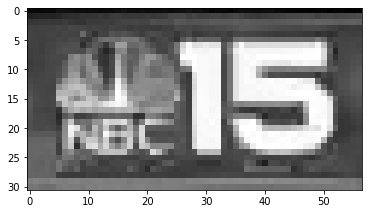

In [88]:
crop = template[184:215,347:404]
plt.imshow(crop,cmap = 'gray')

In [89]:
cd '/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/frames'


/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/frames


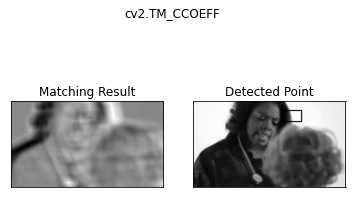

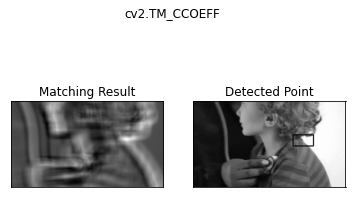

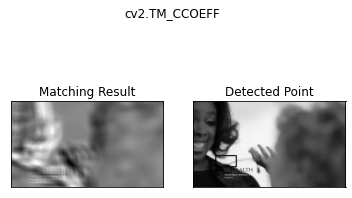

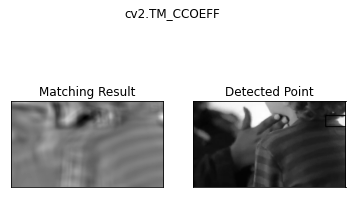

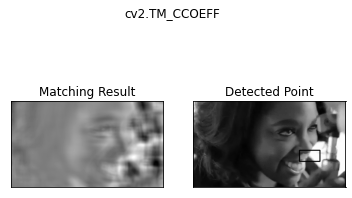

...

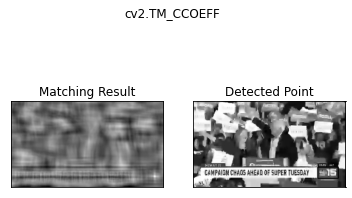

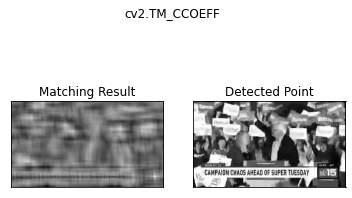

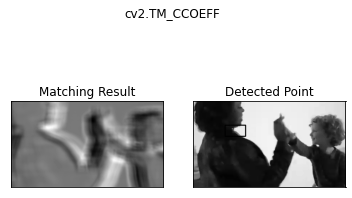

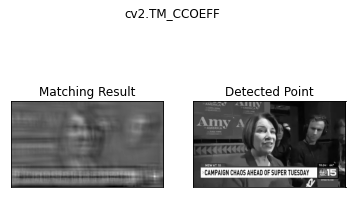

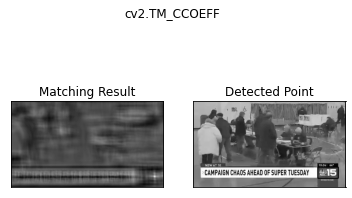

test failed for file: 
.ipynb_checkpoints


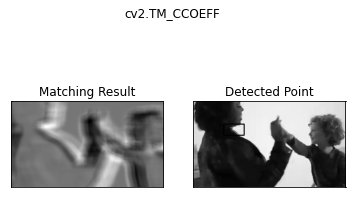

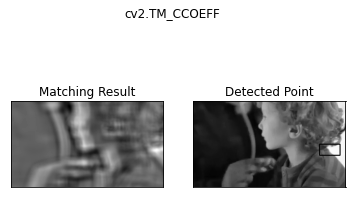

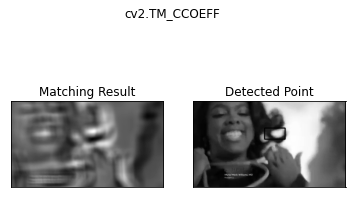

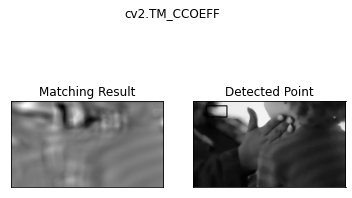

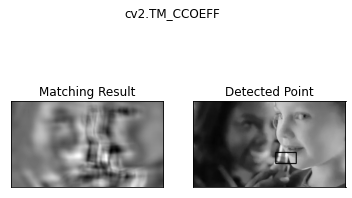

...

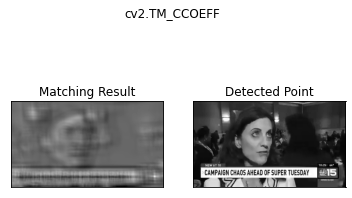

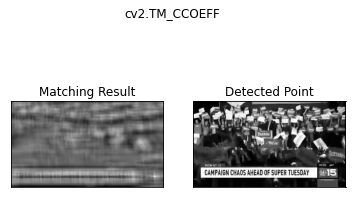

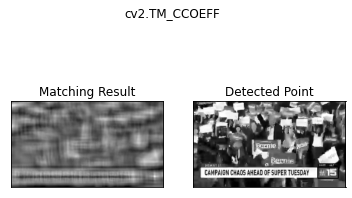

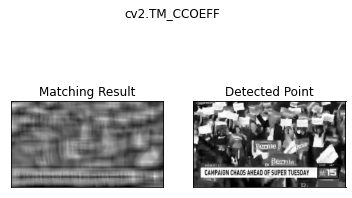

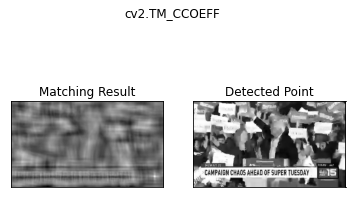

In [84]:
template = crop

# Store width and heigth of template in w and h 
h, w = template.shape
method = eval('cv2.TM_CCOEFF')

for frame in os.listdir('/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/frames'):
  #Read the ad image in grayscale
  img = cv2.imread(frame,0)

   # parse the string
  # Apply template Matching
  try:
    res = cv2.matchTemplate(img,template,method)
    
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(img,top_left, bottom_right, 0, 2)
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle('cv2.TM_CCOEFF')
    plt.show()
  except:
    print('test failed for file: ')
    print(frame)


#### 1.2.2 Discuss the results 

Does the algorithm work well for every frame? What happened for the frames without the NBC News Logo?

The algorithm does not work great for each frame right now.  The recall is good because if the logo appears in the frame, the algorthm is able to pick it up. However, for the frames without the NBC logo, there are many false positives due to similar pixel arrangements.  

#### 1.2.3 Improve the results 

Can you figure out a way to get rid of all the spurious matchings? Show the code and display the improved matching results.

One method to get rid of the spurious matching is to ignore all matches that do not occur in the bottom right section of the frame.


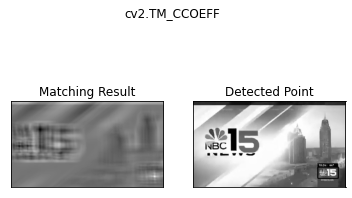

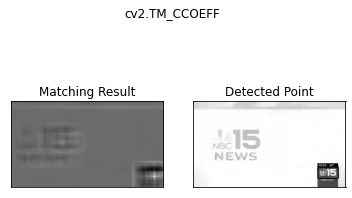

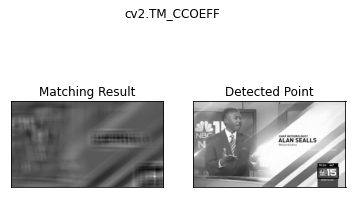

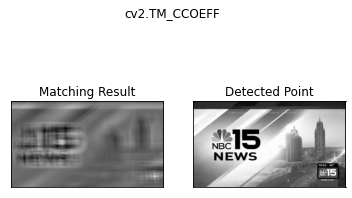

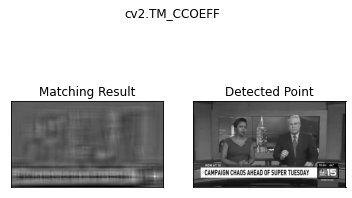

...

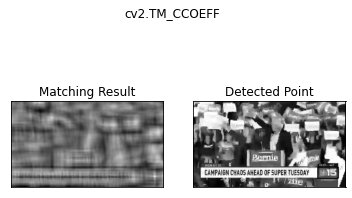

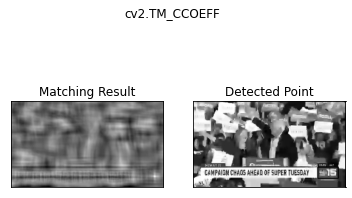

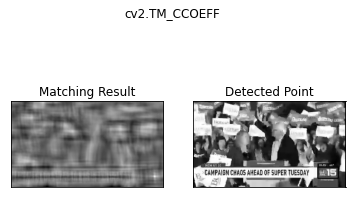

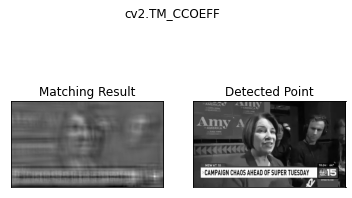

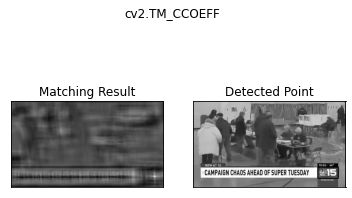

test failed for file: 
.ipynb_checkpoints


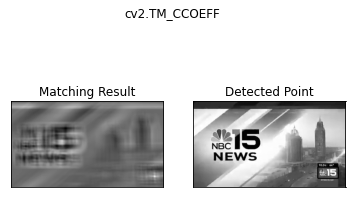

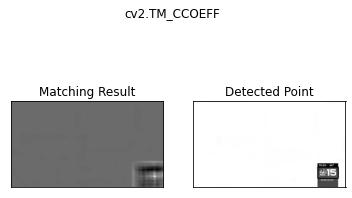

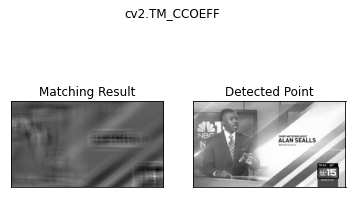

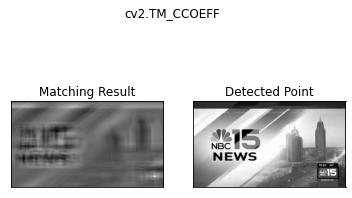

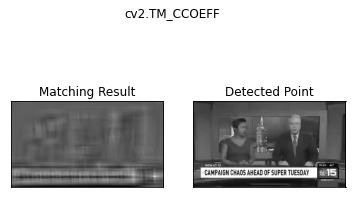

...

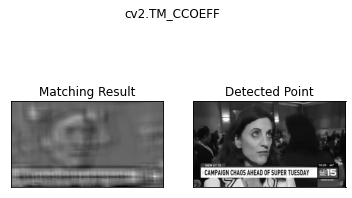

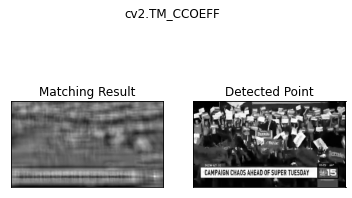

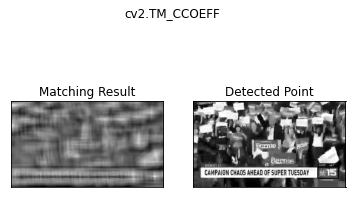

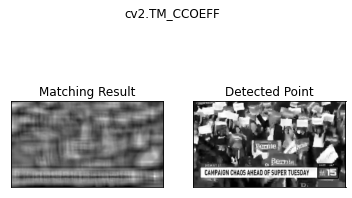

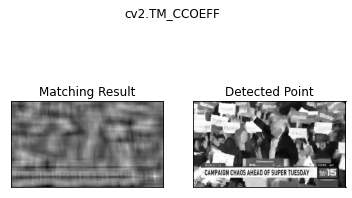

In [90]:
template = crop

# Store width and heigth of template in w and h 
h, w = template.shape


for frame in os.listdir('/content/drive/MyDrive/Colab Notebooks/QAC239/hw3/frames'):
  #Read the ad image in grayscale
  img = cv2.imread(frame,0)

  method = eval('cv2.TM_CCOEFF') # parse the string
  # Apply template Matching

  try:
    
    res = cv2.matchTemplate(img,template,method)

    
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    if max_loc[0]>345 and max_loc[1]>180:
      top_left = max_loc
      bottom_right = (top_left[0] + w, top_left[1] + h)
      cv2.rectangle(img,top_left, bottom_right, 0, 2)
      plt.subplot(121),plt.imshow(res,cmap = 'gray')
      plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
      plt.subplot(122),plt.imshow(img,cmap = 'gray')
      plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
      plt.suptitle('cv2.TM_CCOEFF')
      plt.show()

  except:
    print('test failed for file: ')
    print(frame)

    